In [35]:
import os
import csv
import pandas as pd
import logging

class ProcessData:
    def __init__(self):
        pass
    
    def clean_up_data(self):
        logging.info('in clean_up_data')
        final_data = []
        try:
            for dir in os.listdir():
                if '.' not in dir:
                    for file in os.listdir(dir):
                        f = open(os.path.join(os.getcwd(),dir,file),'r')
                        data = csv.reader(f,delimiter=',')
                        for i,d in list(enumerate(data)):
                            if i not in[0,1,2,3,4]:
                                if len(d) == 7:
                                    if dir == 'bending1' or dir == 'bending2':
                                        d.append('bending')
                                    elif dir == 'cycling':
                                        d.append('cycling')
                                    elif dir == 'lying':
                                        d.append('lying')
                                    elif dir == 'sitting':
                                        d.append('sitting')
                                    elif dir == 'standing':
                                        d.append('standing')
                                    elif dir == 'walking':
                                        d.append('walking')
                                    final_data.append(d)
                                else:
                                    logging.info('skipped corrupt record.')  
        except Exception as e:
            logging.error(f'error in ProcessData clean_up_data: {e}')
        logging.info('out clean_up_data')
        return final_data
    
    def write_data_into_csv(self):
        logging.info('in write_data_into_csv')
        try:
            final_data = self.clean_up_data()
            csv_file = open(os.path.join(os.getcwd(),'cleand_file.csv'), 'w')
            csv_writer = csv.writer(csv_file)
            csv_writer.writerow(['time', 'avg_rss12', 'var_rss12', 'avg_rss13', 'var_rss13', 'avg_rss23', 'var_rss23','label'])
            csv_writer.writerows(final_data)
            logging.info('data written to csv successfully.')
        except Exception as e:
            logging.error(f'error in ProcessData write_data_into_csv: {e}')
        logging.info('out write_data_into_csv')

if __name__ == "__main__":
    # os.chdir('AReM')
    os.makedirs('log',exist_ok=True)
    logging.basicConfig(filename=os.path.join(os.getcwd(),'log','log.txt'),level=logging.INFO,format='%(asctime)s %(levelname)s %(message)s')
    process_data = ProcessData()
    process_data.write_data_into_csv()

In [126]:
import pandas_profiling
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import GridSearchCV
from sklearn.linear_model import LogisticRegression
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import classification_report,confusion_matrix,roc_auc_score

In [36]:
df = pd.read_csv(r'cleand_file.csv',sep=',')

In [23]:
df.shape

(41757, 7)

In [40]:
df.sample(10)

,time,avg_rss12,var_rss12,avg_rss13,var_rss13,avg_rss23,var_rss23,label
17276,119500,48.00,0.00,9.00,0.00,9.75,0.83,lying
22722,41000,42.00,0.00,12.86,1.12,13.07,1.44,sitting
13755,79250,27.00,0.71,6.67,2.05,3.50,2.50,lying
18181,105750,39.00,0.00,11.00,0.00,2.50,1.50,lying
38517,30000,28.75,2.05,11.67,2.05,15.00,2.00,walking
13337,94750,28.00,1.00,3.00,0.00,3.67,1.25,lying
26343,106250,43.67,0.47,16.25,1.09,5.67,1.25,sitting
20785,36750,43.50,0.50,17.50,0.50,15.00,0.71,sitting
23699,45250,45.00,0.00,16.75,0.83,21.00,0.00,sitting
7117,99250,37.33,1.25,10.00,1.00,10.75,3.70,cycling


In [26]:
# Drop time column as it will not help in model trainng and prediction

In [41]:
df.drop('time',inplace=True,axis=1)

In [158]:
df.sample(10)

,avg_rss12,var_rss12,avg_rss13,var_rss13,avg_rss23,var_rss23,label
39255,37.67,1.25,15.00,3.27,15.50,3.28,walking
23508,39.75,0.83,15.25,0.43,15.25,2.17,sitting
19672,39.00,0.00,4.33,2.36,14.33,1.25,lying
13654,27.00,0.00,11.50,0.87,10.75,0.83,lying
35642,26.75,3.34,18.00,1.41,19.50,2.69,walking
6877,35.50,1.50,21.00,4.24,21.67,2.62,cycling
7003,32.25,5.26,19.67,1.89,17.00,3.56,cycling
39643,38.00,7.87,15.00,2.45,17.50,5.22,walking
27999,44.50,0.50,17.75,0.43,12.00,0.00,standing
1270,45.00,0.00,24.25,0.43,32.00,0.00,bending


In [45]:
df['label'].value_counts()

standing    7200
lying       7200
walking     7200
sitting     7199
cycling     7198
bending     5760
Name: label, dtype: int64

In [43]:
# Perform EDA using Pandas profiling
df.profile_report()

Summarize dataset:   0%|          | 0/20 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [46]:
# Obeservations
# Data present in all column is skewed.
# There ane no null values present in all columns.
# There is no high corelation between independent features.
# classes present in label column are balanced.

<AxesSubplot:>

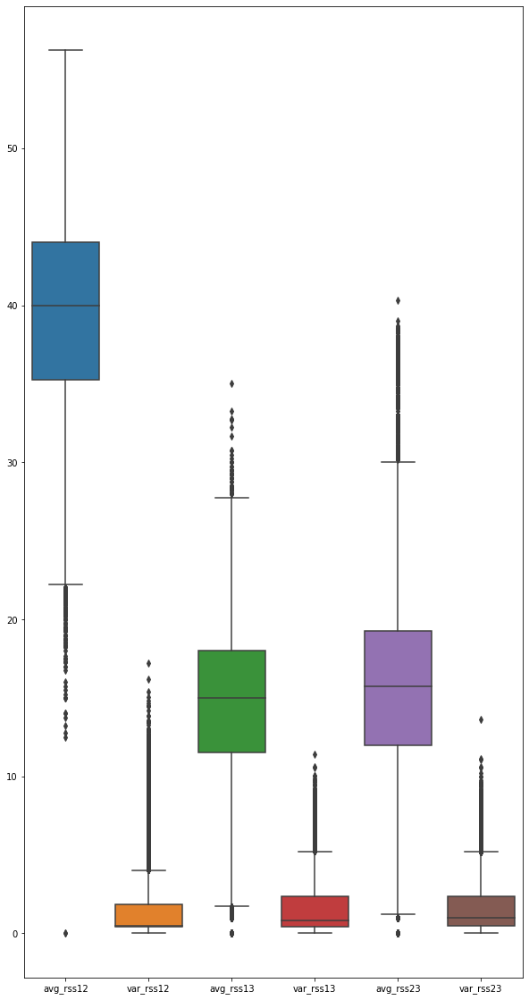

In [77]:
# Lets draw box plot to check outliers in dataset
fig,ax = plt.subplots(figsize=(10,20))
sns.boxplot(data=df,ax=ax)

In [97]:
# Lets remove data from less than 1% quantile for avg_rss12 feature
q = df['var_rss12'].quantile(0.99)
df2= df[df['var_rss12'] < q]

<AxesSubplot:>

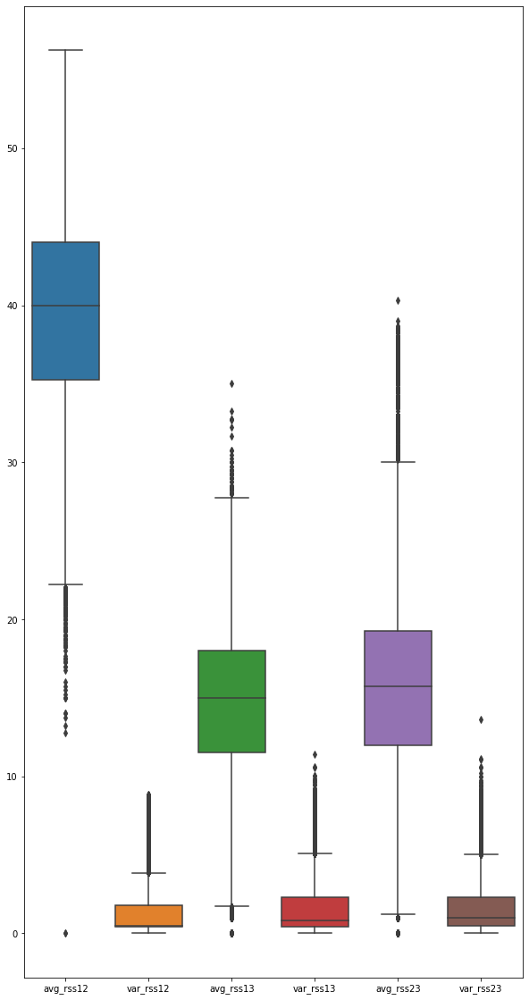

In [98]:
fig,ax = plt.subplots(figsize=(10,20))
sns.boxplot(data=df2,ax=ax)

In [80]:
df2.profile_report()

Summarize dataset:   0%|          | 0/21 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [99]:
# Lets seprate Independent & Depedent
x = df2.drop('label',axis=1)
y=df2['label']

In [100]:
df2['label']

0        bending
1        bending
2        bending
3        bending
4        bending
          ...   
41752    walking
41753    walking
41754    walking
41755    walking
41756    walking
Name: label, Length: 41331, dtype: object

In [96]:
x

,avg_rss12,var_rss12,avg_rss13,var_rss13,avg_rss23,var_rss23
4523,40.00,9.90,26.67,1.70,25.25,4.44
6410,31.75,10.47,15.50,2.29,17.25,3.27
6562,27.00,9.49,18.00,3.00,19.67,4.78
6824,32.25,9.12,13.50,9.39,17.25,2.28
7132,32.75,10.43,17.33,2.87,15.50,2.18
...,...,...,...,...,...,...
41636,29.25,11.26,20.00,4.90,17.75,2.68
41671,32.50,9.66,14.00,2.00,16.00,3.67
41693,32.00,9.90,12.33,3.86,18.00,0.71
41705,33.75,17.24,15.75,2.49,16.50,8.08


In [101]:
# Lets scale down the dataset using StandardScaler
scaler = StandardScaler()
x_scaled = scaler.fit_transform(x)

In [102]:
df3 = pd.DataFrame(x_scaled)

<AxesSubplot:>

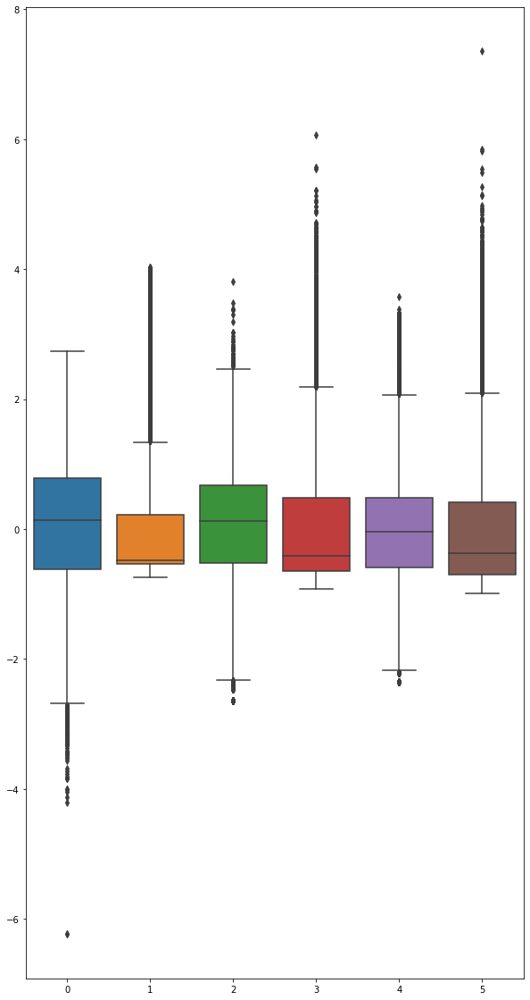

In [103]:
fig,ax = plt.subplots(figsize=(10,20))
sns.boxplot(data=df3,ax=ax)

In [104]:
df3.profile_report()

Summarize dataset:   0%|          | 0/19 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

# Lets convert labels into numeric using LabelEncoder

In [105]:
label_encode = LabelEncoder()
y = label_encode.fit_transform(y)


# Lets divide dataset into train_test using train_test_split

In [137]:
x_train,x_test,y_train,y_test = train_test_split(x_scaled,y,test_size=0.15,random_state=42,stratify=y)

In [138]:
x_test.shape

(6200, 6)

In [139]:
# Lest train logistic model with default parameters
logistic_reg = LogisticRegression()
logistic_reg.fit(x_train,y_train)

LogisticRegression()

In [140]:
logistic_reg.score(x_train,y_train)

0.6620079132390196

In [141]:
y_pred = logistic_reg.predict(x_test)
print(classification_report(y_test,y_pred))

              precision    recall  f1-score   support

           0       0.76      0.71      0.73       864
           1       0.61      0.64      0.63      1069
           2       0.78      0.88      0.83      1080
           3       0.50      0.48      0.49      1080
           4       0.64      0.61      0.63      1080
           5       0.68      0.64      0.66      1027

    accuracy                           0.66      6200
   macro avg       0.66      0.66      0.66      6200
weighted avg       0.66      0.66      0.66      6200



In [142]:
logistic_reg.get_params()

{'C': 1.0,
 'class_weight': None,
 'dual': False,
 'fit_intercept': True,
 'intercept_scaling': 1,
 'l1_ratio': None,
 'max_iter': 100,
 'multi_class': 'auto',
 'n_jobs': None,
 'penalty': 'l2',
 'random_state': None,
 'solver': 'lbfgs',
 'tol': 0.0001,
 'verbose': 0,
 'warm_start': False}

# Experiment using penalty l2 & solver newton-cg

In [144]:
# ‘newton-cg’, ‘sag’ and ‘lbfgs’ solvers support only l2 penalties. ‘elasticnet’ is only supported by the ‘saga’ solve
logistic_newton_cg = LogisticRegression(penalty='l2',solver='newton-cg')
logistic_newton_cg.fit(x_train,y_train)
logistic_newton_cg.score(x_train,y_train)

0.6620363781275796

In [145]:
y_pred = logistic_newton_cg.predict(x_test)
print(classification_report(y_test,y_pred))

              precision    recall  f1-score   support

           0       0.76      0.71      0.73       864
           1       0.61      0.64      0.63      1069
           2       0.78      0.88      0.83      1080
           3       0.50      0.48      0.49      1080
           4       0.64      0.61      0.63      1080
           5       0.68      0.64      0.66      1027

    accuracy                           0.66      6200
   macro avg       0.66      0.66      0.66      6200
weighted avg       0.66      0.66      0.66      6200



# Experiment using penalty l2 & solver sag

In [148]:
logistic_sag = LogisticRegression(penalty='l2',solver='sag')
logistic_sag.fit(x_train,y_train)
logistic_sag.score(x_train,y_train)

0.6620079132390196

In [149]:
y_pred = logistic_sag.predict(x_test)
print(classification_report(y_test,y_pred))

              precision    recall  f1-score   support

           0       0.76      0.71      0.73       864
           1       0.61      0.64      0.63      1069
           2       0.78      0.88      0.83      1080
           3       0.50      0.48      0.49      1080
           4       0.64      0.61      0.63      1080
           5       0.68      0.64      0.66      1027

    accuracy                           0.66      6200
   macro avg       0.66      0.66      0.66      6200
weighted avg       0.66      0.66      0.66      6200



# Experiment using penalty elasticnet & solver saga

In [151]:
logistic_saga = LogisticRegression(penalty='elasticnet',solver='saga',l1_ratio=1)
logistic_saga.fit(x_train,y_train)
logistic_saga.score(x_train,y_train)

0.6620079132390196

In [152]:
y_pred = logistic_saga.predict(x_test)
print(classification_report(y_test,y_pred))

              precision    recall  f1-score   support

           0       0.76      0.71      0.73       864
           1       0.61      0.64      0.63      1069
           2       0.78      0.88      0.83      1080
           3       0.50      0.48      0.49      1080
           4       0.64      0.61      0.63      1080
           5       0.68      0.64      0.66      1027

    accuracy                           0.66      6200
   macro avg       0.66      0.66      0.66      6200
weighted avg       0.66      0.66      0.66      6200



In [ ]:
'liblinear' and 'saga' also handle L1 penalty

# Experiment using penalty l1 & solver liblinear

In [154]:
logistic_liblinear = LogisticRegression(penalty='l1',solver='liblinear')
logistic_liblinear.fit(x_train,y_train)
logistic_liblinear.score(x_train,y_train)

0.6418263072500071

In [155]:
y_pred = logistic_liblinear.predict(x_test)
print(classification_report(y_test,y_pred))

              precision    recall  f1-score   support

           0       0.72      0.80      0.76       864
           1       0.60      0.56      0.58      1069
           2       0.74      0.92      0.82      1080
           3       0.50      0.25      0.33      1080
           4       0.57      0.67      0.62      1080
           5       0.65      0.69      0.67      1027

    accuracy                           0.64      6200
   macro avg       0.63      0.65      0.63      6200
weighted avg       0.63      0.64      0.62      6200



# Experiment using penalty l1 & solver saga

In [156]:
logistic_l1_saga = LogisticRegression(penalty='l1',solver='saga')
logistic_l1_saga.fit(x_train,y_train)
logistic_l1_saga.score(x_train,y_train)

0.6620079132390196

In [157]:
y_pred = logistic_l1_saga.predict(x_test)
print(classification_report(y_test,y_pred))

              precision    recall  f1-score   support

           0       0.76      0.71      0.73       864
           1       0.61      0.64      0.63      1069
           2       0.78      0.88      0.83      1080
           3       0.50      0.48      0.49      1080
           4       0.64      0.61      0.63      1080
           5       0.68      0.64      0.66      1027

    accuracy                           0.66      6200
   macro avg       0.66      0.66      0.66      6200
weighted avg       0.66      0.66      0.66      6200

